# Overview

This notebook visualizes data from the [Liao et al. 2022](https://www.nature.com/articles/s41467-022-31949-2) Xenopus laevis adult cell atlas, sample ["Xenopus_brain_COL65"](https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSM6214268), in gene and Orthogroup spaces.


# 0. Setup

Import packages and specify any important functions here.

If `arcadia_pycolor` is not yet installed, run:
```
!pip install git+https://github.com/Arcadia-Science/arcadia-pycolor.git#egg=arcadia_pycolor --upgrade
```

In [1]:
# import standard python packages
import pandas as pd
import subprocess
import os
import dill
import scanpy as sc
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.pyplot import rc_context
import seaborn as sns
import numpy as np
import arcadia_pycolor as apc

sc.settings.verbosity = 3
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')
mpl.rcParams['axes.prop_cycle'] = mpl.cycler(color=apc.arcadia_All_ordered.values())
mpl.rcParams['pdf.fonttype'] = 42

# add the utils and env directories to the path
import sys
sys.path.append('../../utils/')
sys.path.append('../../env/')

# import functions from utils directory files
from string_functions import *
from biofile_handling import *
from scanpy_wrappers import *

# import paths to software installs from env
from install_locs import *

scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.21.6 scipy==1.9.1 pandas==1.4.4 scikit-learn==1.1.2 statsmodels==0.13.2 python-igraph==0.9.9 pynndescent==0.5.7


# 1. Load BioFileDocket

Load in the BioFileDocket file for this dataset using `BioFileDocket.unpickle()`

In [2]:
################
# general info #
################

# Specify the name of the species folder in Amazon S3
species = 'Xenopus_laevis'

# Specify any particular identifying conditions, eg tissue type:
conditions = 'adultbrain'

################

sample_BFD = BioFileDocket(species, conditions).get_from_s3().unpickle()
sample_BFD.s3_to_local()

/home/ec2-user/glial-origins/output/Xlae_adultbrain/ already exists
Files will be saved into /home/ec2-user/glial-origins/output/Xlae_adultbrain/
file Xlae_adultbrain_BioFileDocket.pkl already exists at /home/ec2-user/glial-origins/output/Xlae_adultbrain/Xlae_adultbrain_BioFileDocket.pkl
file XENLA_9.2_Xenbase.gtf already exists at /home/ec2-user/glial-origins/output/Xlae_adultbrain/XENLA_9.2_Xenbase.gtf
file XENLA_9.2_GCA.gff already exists at /home/ec2-user/glial-origins/output/Xlae_adultbrain/XENLA_9.2_GCA.gff
file XENLA_9.2_genome.fa already exists at /home/ec2-user/glial-origins/output/Xlae_adultbrain/XENLA_9.2_genome.fa
file GSM6214268_Xenopus_brain_COL65_dge.txt already exists at /home/ec2-user/glial-origins/output/Xlae_adultbrain/GSM6214268_Xenopus_brain_COL65_dge.txt
file Xlae_adultbrain_Xenbase_UniProtIDs.txt already exists at /home/ec2-user/glial-origins/output/Xlae_adultbrain/Xlae_adultbrain_Xenbase_UniProtIDs.txt
file Xlae_adultbrain_uniprot-idmm.tsv already exists at /hom

# 2. Load Gxc/Exc matrices

Load in and inspect the genes by cells and embedding by cells matrices.

In [3]:
gxc = pd.read_csv(sample_BFD.gxc.path, sep = '\t', nrows = 10)
display(gxc)
exc = pd.read_csv(sample_BFD.Orthogroup_exc.path, sep = '\t', nrows = 10)
display(exc)

,gene_name,AACCTATTCATATAAGGG,CTCGCATCAAAGTTAACT,AACCTAGTATACTTCCGC,AACCTAAAAGTTCTGAAA,CTCGCACGCACCCTCCAT,ACGTTGTATTGTAGCGAG,ACGAGCATGCTTTAGTCG,AACCTAGTCCCGCCATCT,AACCTAGCGAATTAGAGA,...,TCACTTGTTGCCATGCTT,TCGGGTTGTCACACTTAT,TCGTAATCGTAAGTTGCC,TGTCACGAATTACACAAG,TGTGCGTACTTCTAGTCG,TTAACTATACAGTGGATG,TTGGACACTTATGATCTT,AAAGTTACTTATGCCCTC,AACCTACGCACCTGCGGA,AACCTATAGTCGCTGTGT
0,3.S,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,42Sp43.L,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,42Sp50.L,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,AK6.L,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
4,AK6.S,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,MGC107841.L,1,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,MGC107851.L,0,1,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
7,MGC107876.L,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
8,MGC108117.L,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,MGC108429.L,0,1,3,1,1,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0


,Orthogroup,AACCTATTCATATAAGGG,CTCGCATCAAAGTTAACT,AACCTAGTATACTTCCGC,AACCTAAAAGTTCTGAAA,CTCGCACGCACCCTCCAT,ACGTTGTATTGTAGCGAG,ACGAGCATGCTTTAGTCG,AACCTAGTCCCGCCATCT,AACCTAGCGAATTAGAGA,...,TCACTTGTTGCCATGCTT,TCGGGTTGTCACACTTAT,TCGTAATCGTAAGTTGCC,TGTCACGAATTACACAAG,TGTGCGTACTTCTAGTCG,TTAACTATACAGTGGATG,TTGGACACTTATGATCTT,AAAGTTACTTATGCCCTC,AACCTACGCACCTGCGGA,AACCTATAGTCGCTGTGT
0,OG0000000,0,0,0,0,0,3,1,1,0,...,0,0,0,0,0,0,0,0,0,0
1,OG0000002,7,3,4,7,2,4,6,3,0,...,0,0,0,0,0,0,0,0,0,0
2,OG0000004,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,OG0000007,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,OG0000012,1,2,3,4,0,1,2,2,5,...,0,0,0,0,0,0,0,0,0,0
5,OG0000024,0,2,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,OG0000025,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,OG0000038,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,OG0000048,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,OG0000051,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


### Subsample data to remove most unannotated cells

Of the 30k cells in this dataset, around 20k are unannotated, impeding visualization.  
This cell subsamples unannotated cells at 10% using a fixed random state.  
This random state is shared with the StruCluster space.

In [4]:
cell_annots = pd.read_csv(sample_BFD.cellannot.path, sep = '\t')['cell_barcode'].to_list()
gxc_sample = gxc.sample(random_state = 20230403, axis = 'columns', frac = 0.1)
unannot_cols = [i for i in gxc_sample.columns if i not in cell_annots and i != 'gene_name']

gxc_subsampled_obj = GxcFile(
    filename = sample_BFD.gxc.filename.replace('.txt', '_subsampled.txt'),
    sampledict = sample_BFD.sampledict,
    reference_genome = sample_BFD.genome_fasta,
    reference_annot = sample_BFD.annot)

if not os.path.exists(gxc_subsampled_obj.path):
    gxc_subsampled = pd.read_csv(sample_BFD.gxc.path, sep = '\t', usecols = ['gene_name'] + cell_annots + unannot_cols)

    gxc_subsampled.to_csv(gxc_subsampled_obj.path, index = None, sep = '\t')
sample_BFD.add_keyfile('gxc_sub', gxc_subsampled_obj)


exc_subsampled_obj = ExcFile(
    filename = sample_BFD.Orthogroup_exc.filename.replace('.txt', '_subsampled.txt'),
    sampledict = sample_BFD.sampledict,
    gxcfile = gxc_subsampled_obj,
    embedding = 'Orthogroup')

if not os.path.exists(exc_subsampled_obj.path):
    exc_subsampled = pd.read_csv(sample_BFD.Orthogroup_exc.path, sep = '\t', usecols = ['Orthogroup'] + cell_annots + unannot_cols)

    exc_subsampled.to_csv(exc_subsampled_obj.path, index = None, sep = '\t')
sample_BFD.add_keyfile('Orthogroup_exc_sub', exc_subsampled_obj)

sample_BFD.pickle()

key "gxc_sub" already exists, ignoring
key "Orthogroup_exc_sub" already exists, ignoring


# 3A. Load gxc matrix into scanpy

In [5]:
scanpy_data = ScanpyMetaObject(
    matrix = sample_BFD.gxc_sub,
    sampledict = sample_BFD.sampledict
    )
scanpy_data.read()

... reading from cache file cache/home-ec2-user-glial-origins-output-Xlae_adultbrain-GSM6214268_Xenopus_brain_COL65_dge_subsampled.h5ad


# 4A. Run basic filtering and regressions on gxc data
Each function call collapses several scanpy native functions into a single function.  
See the `utils/scanpy_wrapper.py` document for more details about the specific subfunctions.

normalizing counts per cell


/home/ec2-user/miniconda3/envs/glial_origins/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:197: UserWarning: Some cells have zero counts
  warn(UserWarning('Some cells have zero counts'))


    finished (0:00:04)


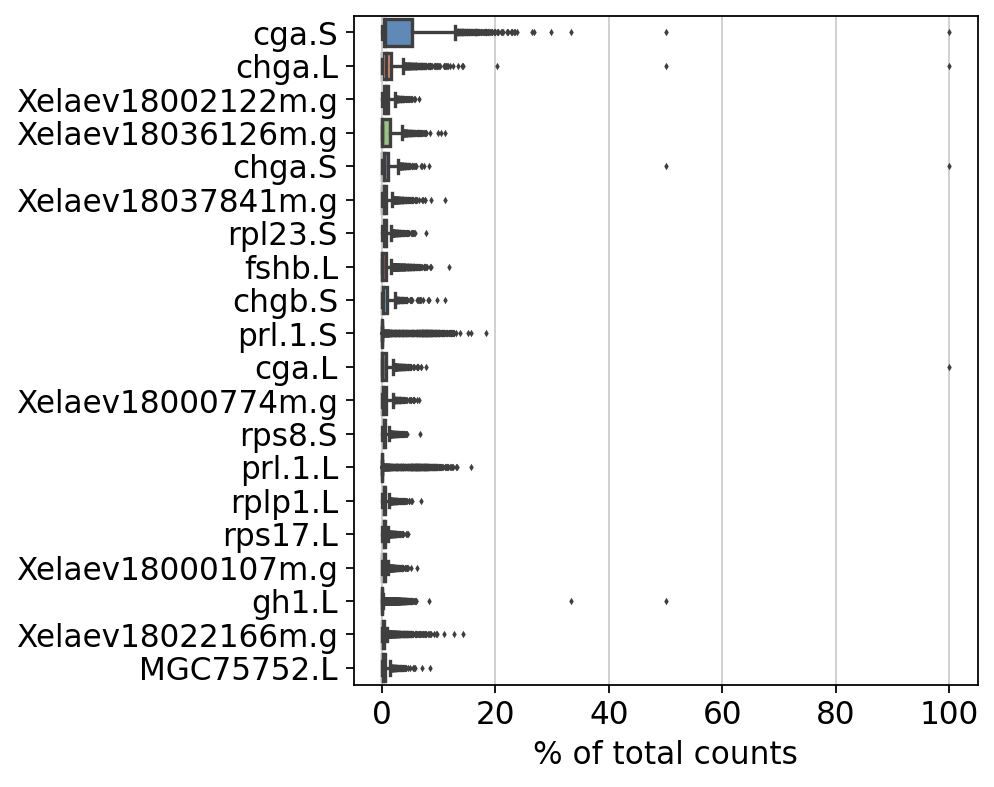

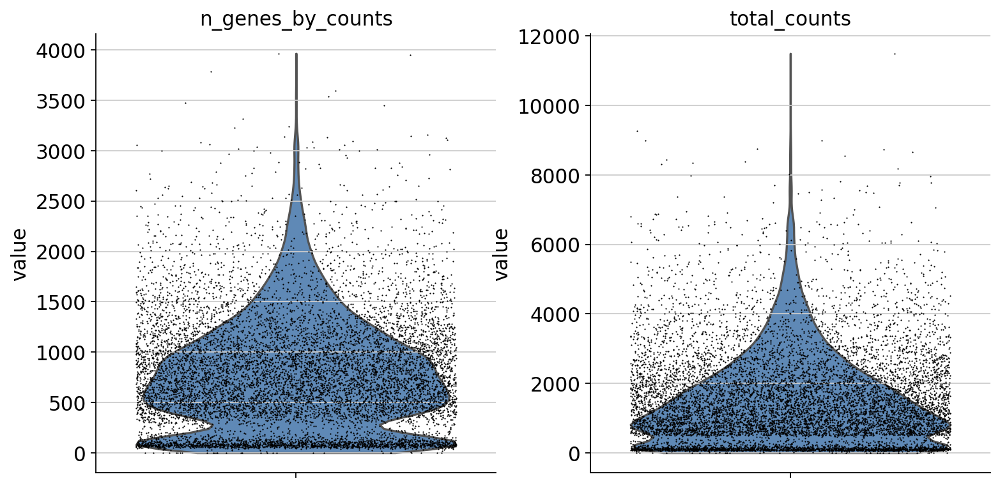

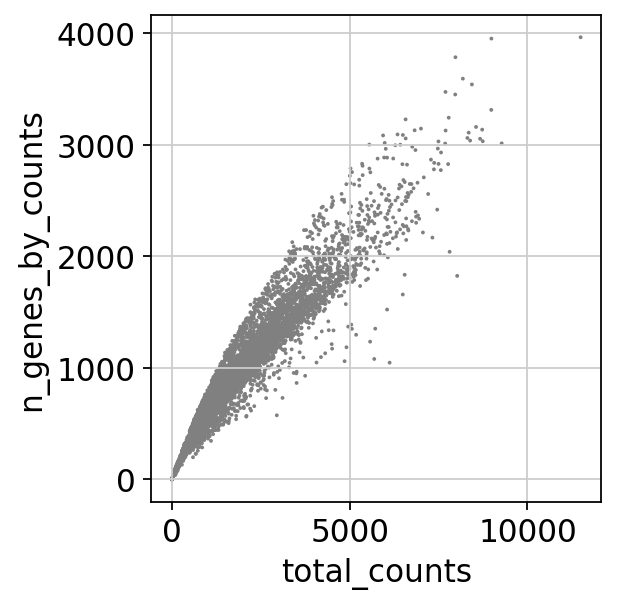

filtered out 1243 cells that have less than 100 genes expressed
filtered out 7740 genes that are detected in less than 20 cells


/home/ec2-user/miniconda3/envs/glial_origins/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:02)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


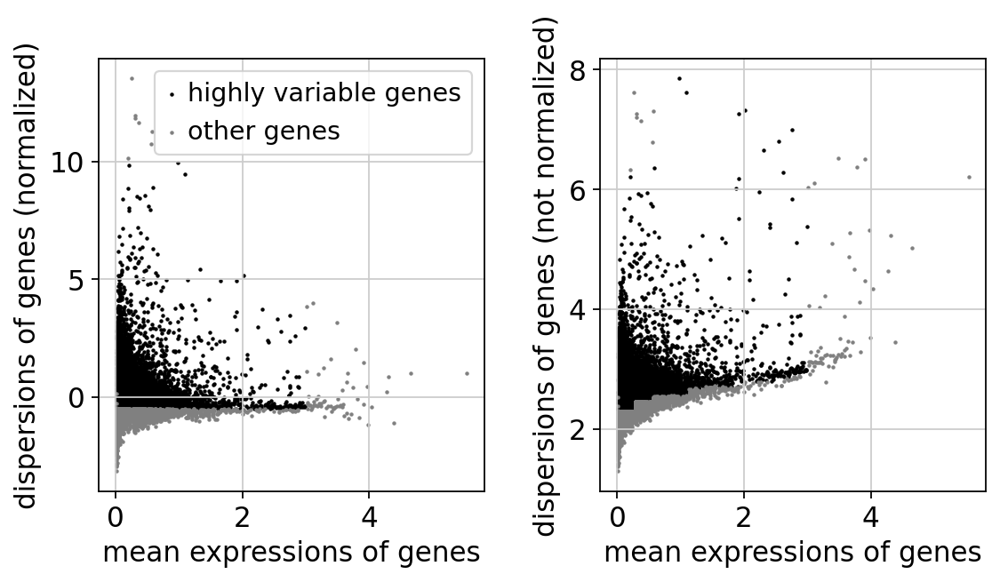

regressing out ['total_counts']
    finished (0:02:17)


In [6]:
sc.pl.highest_expr_genes(scanpy_data.adata, n_top=20, )
scanpy_data.violin()
scanpy_data.cellgene_filter(min_genes=100, min_cells=20)
scanpy_data.normalize(max_n_genes_by_counts = 7000, target_sum = 1e4)
scanpy_data.variable_filter(min_mean = 0.0125, max_mean = 3, min_disp = -0.5, max_disp = 10)
scanpy_data.regress_scale(how = ['total_counts'], max_value = 10)

### Map cell type annotations

In [7]:
scanpy_data.map_cellannots(sample_BFD.cellannot)

# 5A. Run PCA and UMAP/Leiden on gxc data

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:05)


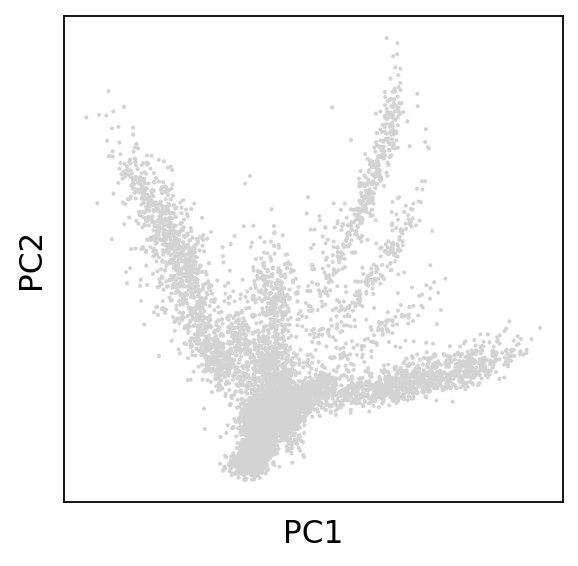

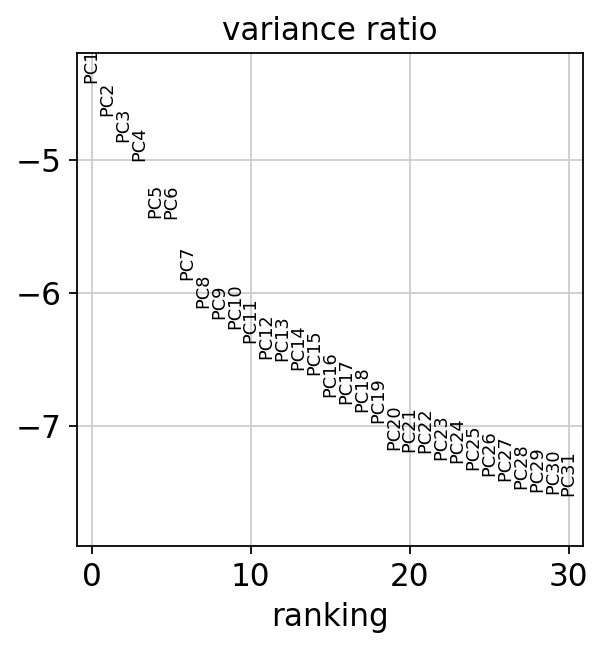

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:32)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:37)
running Leiden clustering
    finished: found 24 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:02)


<Figure size 800x800 with 0 Axes>

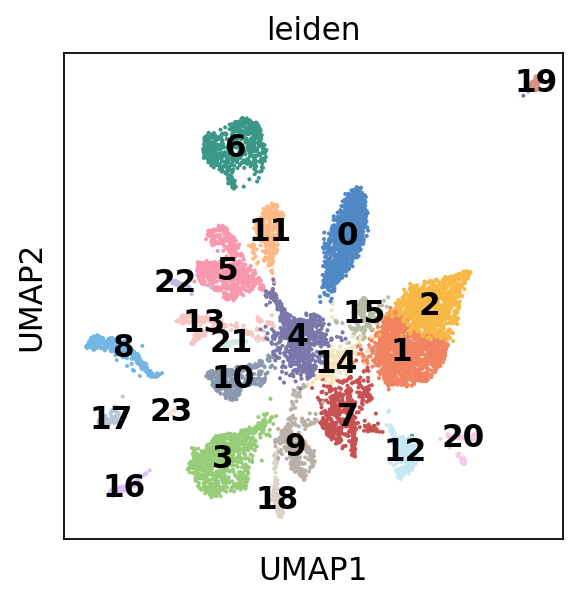

In [8]:
scanpy_data.pca_basic()

plt.figure(figsize = (10, 10))
scanpy_data.umap_leiden(palette = list(apc.arcadia_All_ordered.keys()) + ['arcadia:forest', 'arcadia:bark', 'arcadia:crow'])

# 6A. Plot expression of glial markers in gxc data

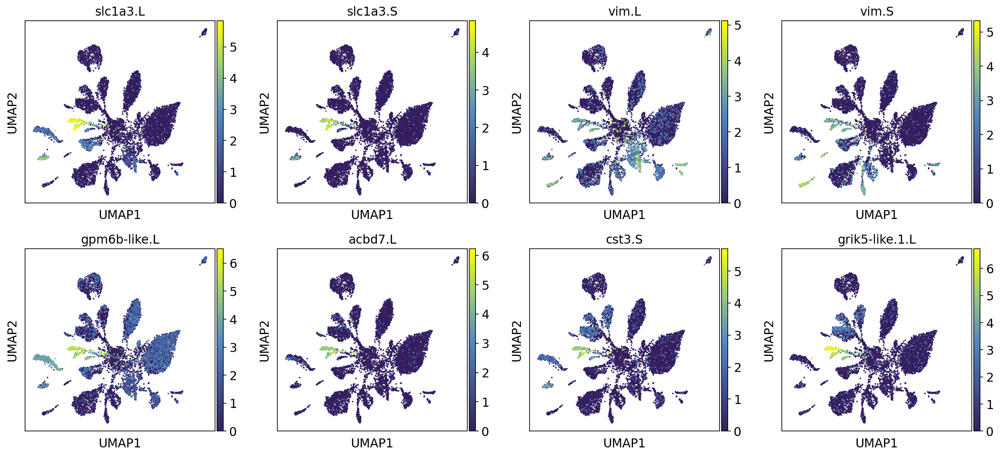

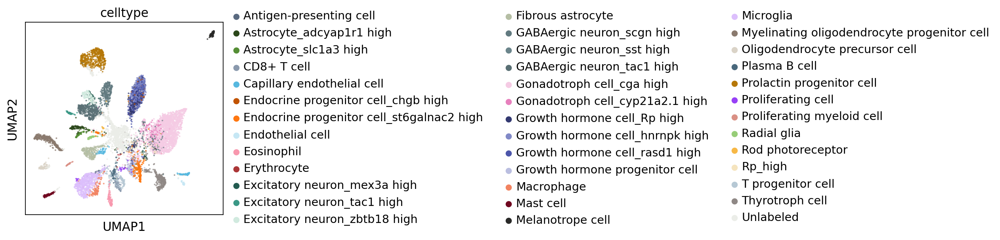

In [9]:
glial_markers = ['slc1a3.L', 'slc1a3.S', 'vim.L', 'vim.S', 'gpm6b-like.L', 'acbd7.L', 'cst3.S', 'grik5-like.1.L']
sc.pl.umap(scanpy_data.adata, color=glial_markers, cmap = 'arcadia:viridis',
          save = '_'.join([sample_BFD.species_prefix, 'Gene', 'glial-markers', 'scatter.pdf']))

celltype_palette = {
    # unlabeled, lightgrey
    'Unlabeled': apc.arcadia_Core['arcadia:lightgrey'],
    
    # myeloid cells, dragon-orange-rose-amber
    'Erythrocyte': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:dragon'], 0.8),
    'Proliferating myeloid cell': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:mars'], 1),
    'Eosinophil': apc.arcadia_Accent_all['arcadia:rose'],
    'Macrophage': apc.arcadia_Accent_all['arcadia:amber'],
    'Mast cell': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:rose'], 0.3),
    
    # lymphoid cells
    'Antigen-presenting cell': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:marineblue'], 0.7),
    'T progenitor cell': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:denim'], 1),
    'CD8+ T cell': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:marineblue'], 1),
    'Plasma B cell': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:denim'], 0.5),
    
    # endocrine cells
    'Growth hormone progenitor cell': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:wish'], 1),
    'Growth hormone cell_hnrnpk high': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:wish'], 0.8),
    'Growth hormone cell_rasd1 high': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:wish'], 0.6),
    'Growth hormone cell_Rp high': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:wish'], 0.4),
    'Thyrotroph cell': apc.arcadia_Neutral['arcadia:bark'],
    'Gonadotroph cell_cga high': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:blossom'], 1),
    'Gonadotroph cell_cyp21a2.1 high': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:blossom'], 0.8),
    'Endocrine progenitor cell_st6galnac2 high': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:orange'], 0.7),
    'Endocrine progenitor cell_chgb high': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:orange'], 0.5),
    'Melanotrope cell': apc.arcadia_Neutral['arcadia:crow'],
    'Prolactin progenitor cell': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:canary'], 0.6),
    
    # neuron: seaweed-mint-forest
    'Excitatory neuron_tac1 high': apc.arcadia_Accent_all['arcadia:seaweed'],
    'Excitatory neuron_zbtb18 high': apc.arcadia_Accent_all['arcadia:mint'],
    'Excitatory neuron_mex3a high': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:seaweed'], 0.6),
    'GABAergic neuron_tac1 high': apc.adjust_lightness(apc.arcadia_Core['arcadia:forest'], 1),
    'GABAergic neuron_scgn high': apc.adjust_lightness(apc.arcadia_Core['arcadia:forest'], 1.1),
    'GABAergic neuron_sst high': apc.adjust_lightness(apc.arcadia_Core['arcadia:forest'], 1.2),
    
    # oligodendrocytes: chateau-taupe
    'Myelinating oligodendrocyte progenitor cell': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:chateau'], 0.7),
    'Oligodendrocyte precursor cell': apc.arcadia_Accent_all['arcadia:taupe'],
    
    # astrocytes
    'Fibrous astrocyte': apc.arcadia_Accent_all['arcadia:sage'],
    'Astrocyte_slc1a3 high': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:lime'], 0.6),
    'Astrocyte_adcyap1r1 high': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:lime'], 0.3),
    'Radial glia': apc.arcadia_Accent_all['arcadia:lime'],
    
    # endothelial cell
    'Capillary endothelial cell': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:bluesky'], 0.7),
    'Endothelial cell': apc.arcadia_Accent_all['arcadia:bluesky'],
    
    # other
    'Rp_high': apc.arcadia_Accent_all['arcadia:oat'],
    'Rod photoreceptor':  apc.arcadia_Accent_all['arcadia:canary'],
    
    # microglia
    'Microglia': apc.arcadia_Accent_all['arcadia:periwinkle'],
    'Proliferating cell': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:periwinkle'], 0.7),
}

# Also plot celltype from cell annotation
sc.pl.umap(scanpy_data.adata, color='celltype', alpha = 0.75, palette = celltype_palette,
          save = '_'.join([sample_BFD.species_prefix, 'Gene', 'celltypes', 'scatter.pdf']))

### Generate confusion matrix

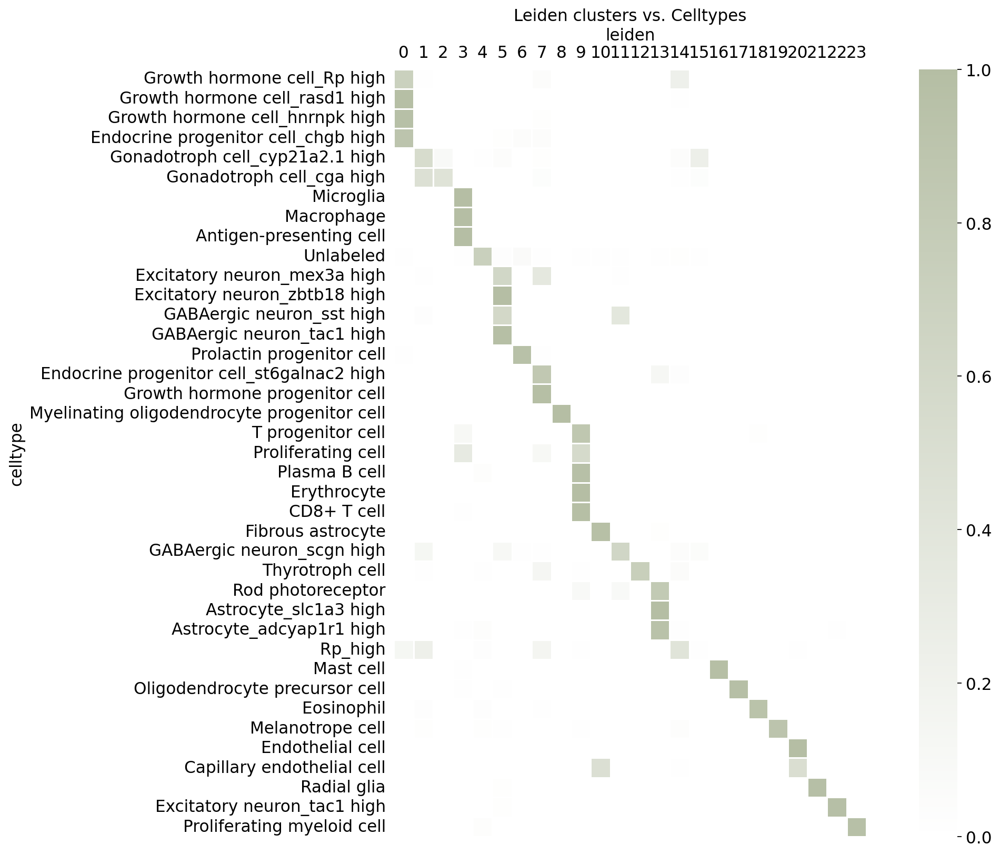

In [10]:
ctmx = sc.metrics.confusion_matrix("celltype", "leiden", scanpy_data.adata.obs)
ctmx_diag = diagonalize_df(ctmx)

plt.figure(figsize = (16, 12))
sns.heatmap(ctmx_diag, square = True, cmap = 'arcadia:sages', linewidth = 0.5)
plt.gca().xaxis.tick_top()
plt.gca().xaxis.set_label_position('top')
plt.tick_params(left = False, top = False)
plt.title('Leiden clusters vs. Celltypes')
plt.savefig(sample_BFD.directory + sample_BFD.species_prefix + '_Leiden-vs-Celltypes-confusion-Genes.pdf')

# 7A. Get top marker genes and plot them

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:22)


/home/ec2-user/miniconda3/envs/glial_origins/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/home/ec2-user/miniconda3/envs/glial_origins/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/home/ec2-user/miniconda3/envs/glial_origins/lib/python3.10/site-packages/scanpy/tools/_ran

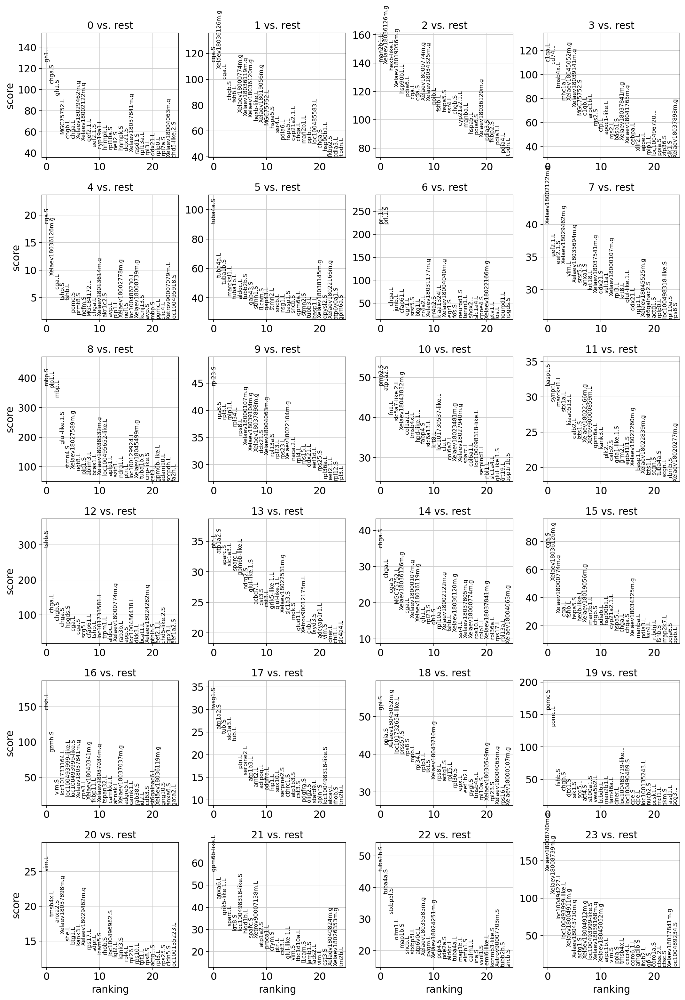

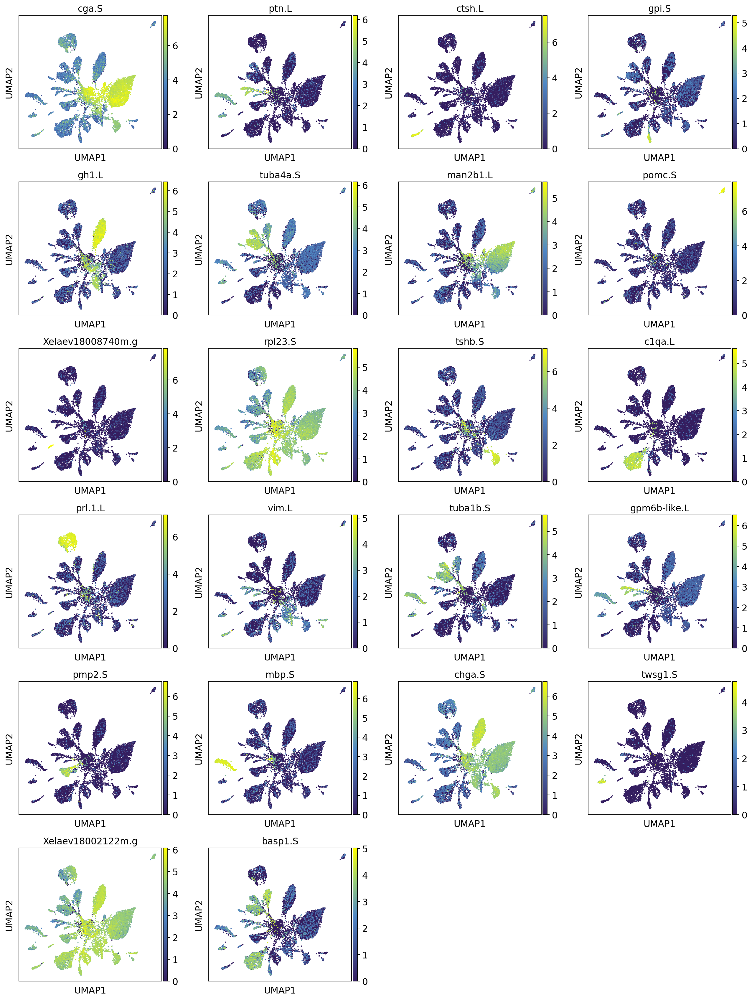

In [11]:
scanpy_data.rank_genes()
top_key, marker_key = scanpy_data.get_top_genes('gene-name')

# Running the line below exports top genes to file
#scanpy_data.export_top_genes(top_key)

sc.pl.umap(scanpy_data.adata, color=getattr(scanpy_data, marker_key), cmap = 'arcadia:viridis')

# 8A. Cluster-specific genes

You can plot the `top_n` genes from a given `cluster_num` here for exploratory purposes.

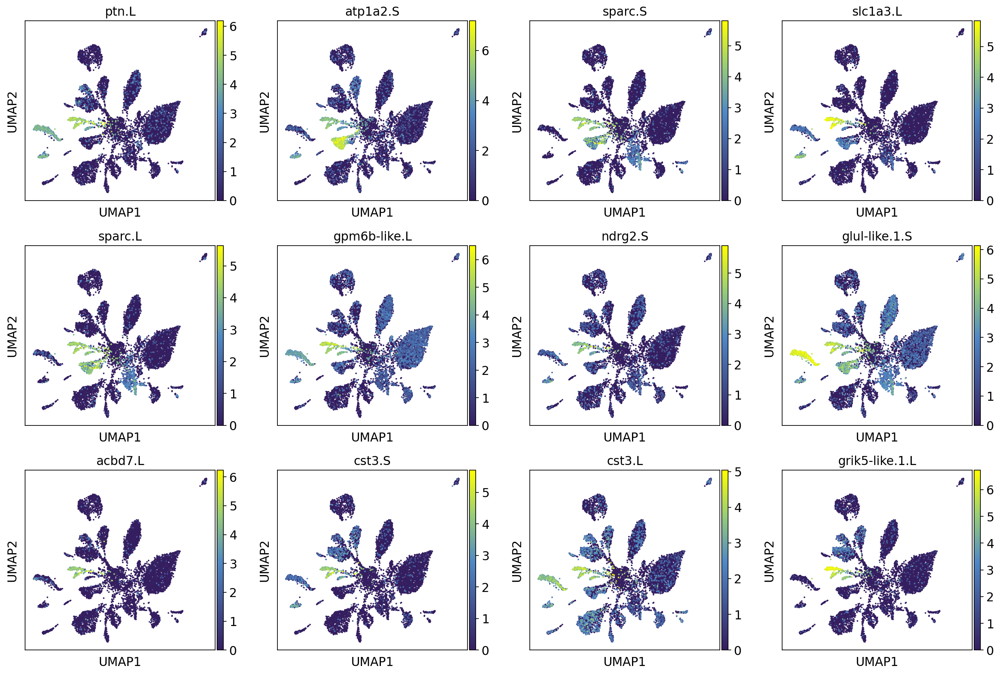

In [12]:
cluster_num = 13
top_n = 12
sc.pl.umap(scanpy_data.adata, color=scanpy_data.marker_genes_df[str(cluster_num)].tolist()[0:top_n], cmap = 'arcadia:viridis')

# 3B. Load exc matrix into scanpy

In [13]:
orthogroup_data = ScanpyMetaObject(
    matrix = sample_BFD.Orthogroup_exc_sub,
    sampledict = sample_BFD.sampledict
    )
orthogroup_data.read()

... reading from cache file cache/home-ec2-user-glial-origins-output-Xlae_adultbrain-GSM6214268_Xenopus_brain_COL65_dge_asOrthogroup_subsampled.h5ad


# 4B. Run basic filtering and regressions on gxc data
Each function call collapses several scanpy native functions into a single function.  
See the `utils/scanpy_wrapper.py` document for more details about the specific subfunctions.

normalizing counts per cell


/home/ec2-user/miniconda3/envs/glial_origins/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:197: UserWarning: Some cells have zero counts
  warn(UserWarning('Some cells have zero counts'))


    finished (0:00:02)


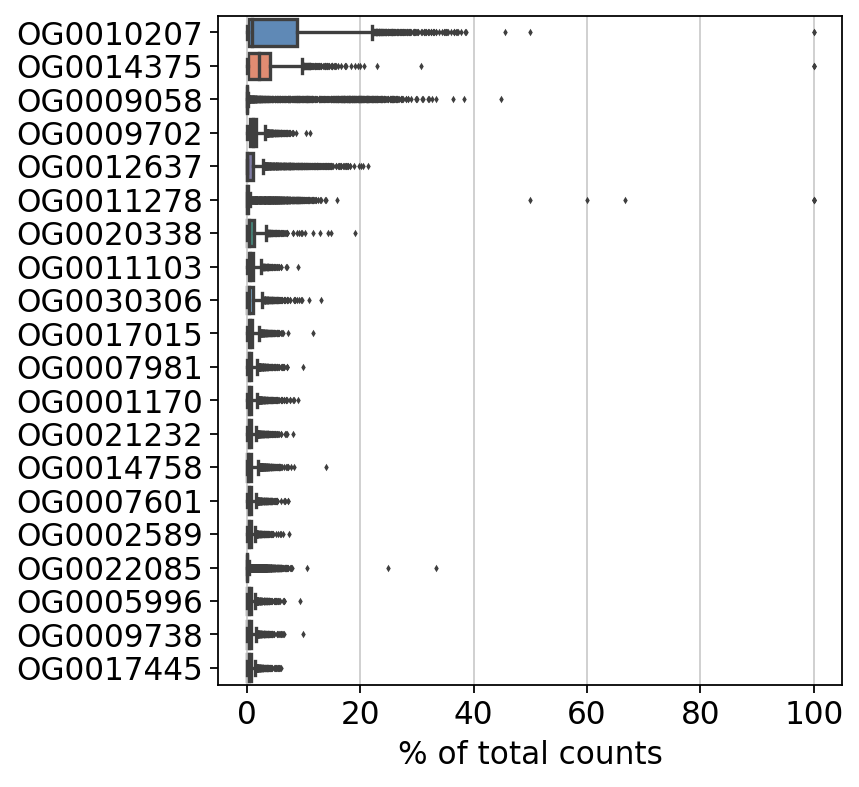

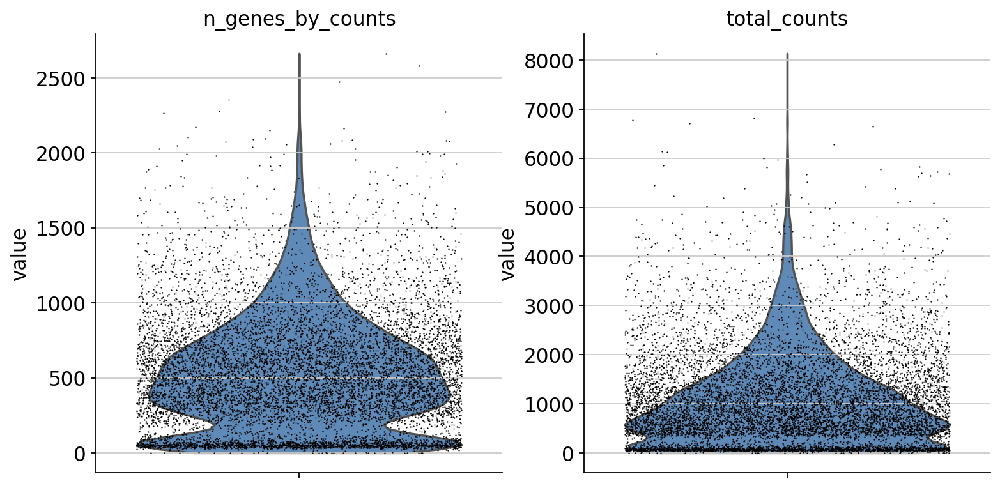

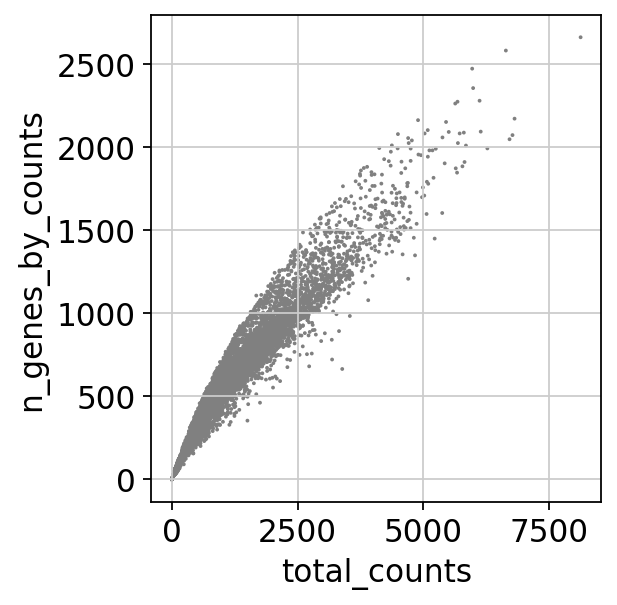

filtered out 1779 cells that have less than 100 genes expressed
filtered out 1900 genes that are detected in less than 20 cells


/home/ec2-user/miniconda3/envs/glial_origins/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


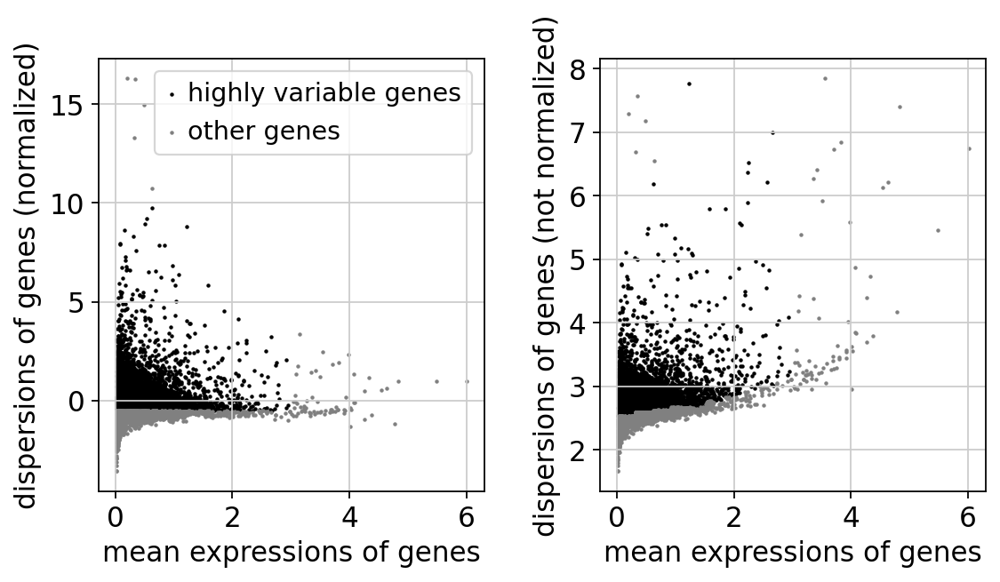

regressing out ['total_counts']
    finished (0:01:16)


In [14]:
sc.pl.highest_expr_genes(orthogroup_data.adata, n_top=20, )
orthogroup_data.violin()
orthogroup_data.cellgene_filter(min_genes=100, min_cells=20)
orthogroup_data.normalize(max_n_genes_by_counts = 7000, target_sum = 1e4)
orthogroup_data.variable_filter(min_mean = 0.0125, max_mean = 3, min_disp = -0.5, max_disp = 10)
orthogroup_data.regress_scale(how = ['total_counts'], max_value = 10)

### Map cell type annotations

In [15]:
orthogroup_data.map_cellannots(sample_BFD.cellannot)

# 5B. Run PCA and UMAP/Leiden on exc data

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:03)


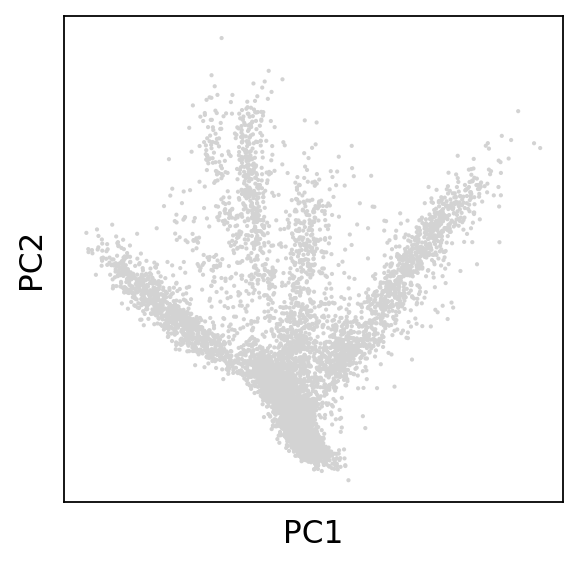

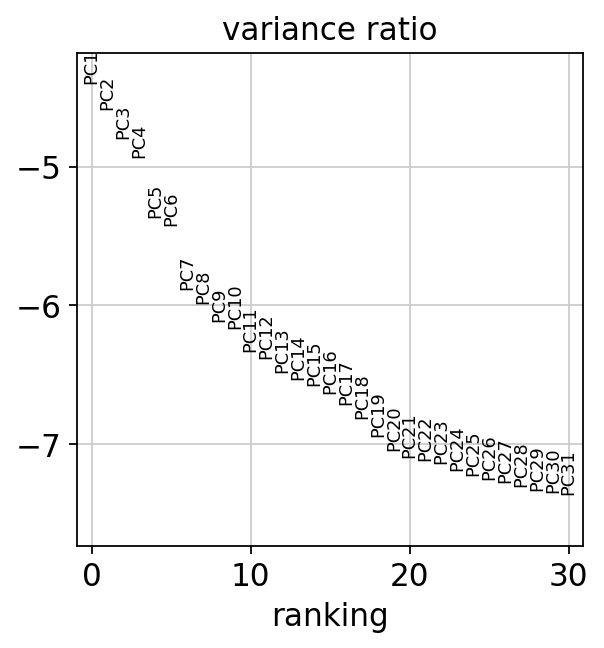

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:33)
running Leiden clustering
    finished: found 20 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:01)


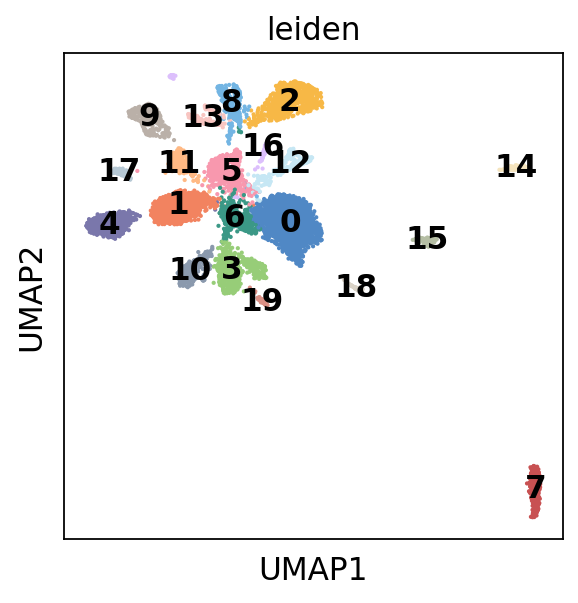

In [16]:
orthogroup_data.pca_basic()
orthogroup_data.umap_leiden(palette = list(apc.arcadia_All_ordered.keys()), 
                            save_file = '_'.join([orthogroup_data.species_prefix, orthogroup_data.datatype, 'Orthogroup', 'leiden.pdf']))

# 6B. Map, then plot expression of glial markers in exc data

,gene_name,Orthogroup
7932,slc1a3.L,OG0003009
10605,slc1a3.S,OG0003009
29274,cst3.S,OG0012694
30782,vim.L,OG0018047
30798,acbd7.L,OG0021986
32956,vim.S,OG0018047
35593,grik5-like.1.L,OG0019098


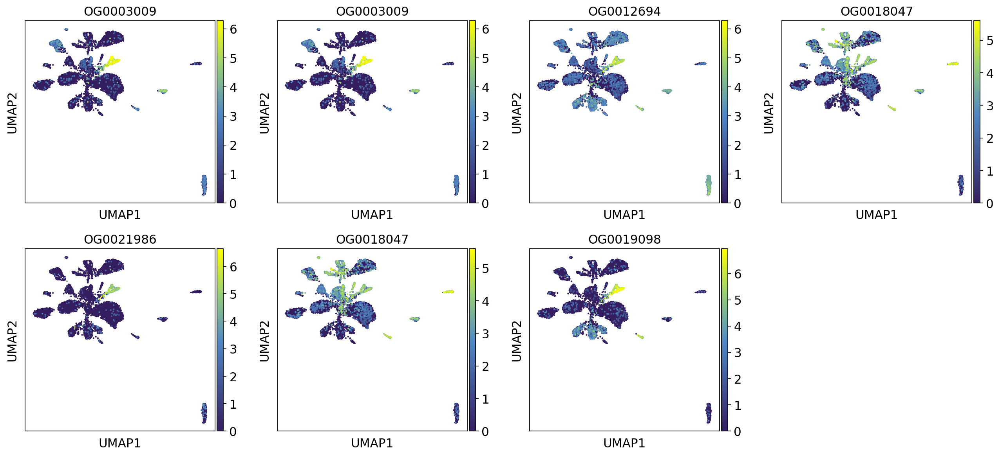

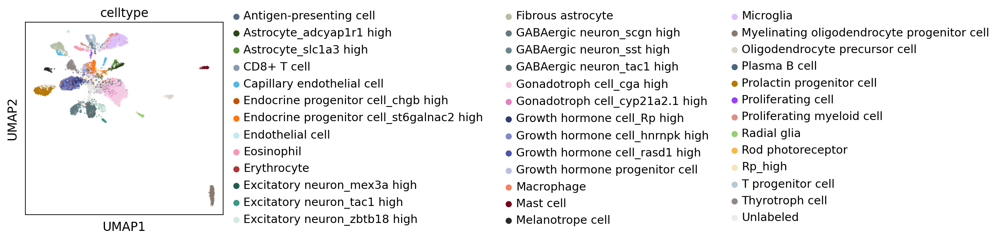

In [17]:
# Retrieve idmm object from BioFileDocket
idmm_object = sample_BFD.og_idmm

# Map gene names to orthogroup IDs
glial_og = orthogroup_data.map_gene_to_id(idmm_object, glial_markers, 'gene_name', 'Orthogroup')

# Plot cells by orthogroups
sc.pl.umap(orthogroup_data.adata, color=glial_og, cmap = 'arcadia:viridis',
          save = '_'.join([sample_BFD.species_prefix, 'OG', 'glial-markers', 'scatter.pdf']))

# Also plot celltype from cell annotation
sc.pl.umap(orthogroup_data.adata, color='celltype', alpha = 0.5, palette = celltype_palette,
          save = '_'.join([sample_BFD.species_prefix, 'OG', 'celltypes', 'scatter.pdf']))

### Generate confusion matrix

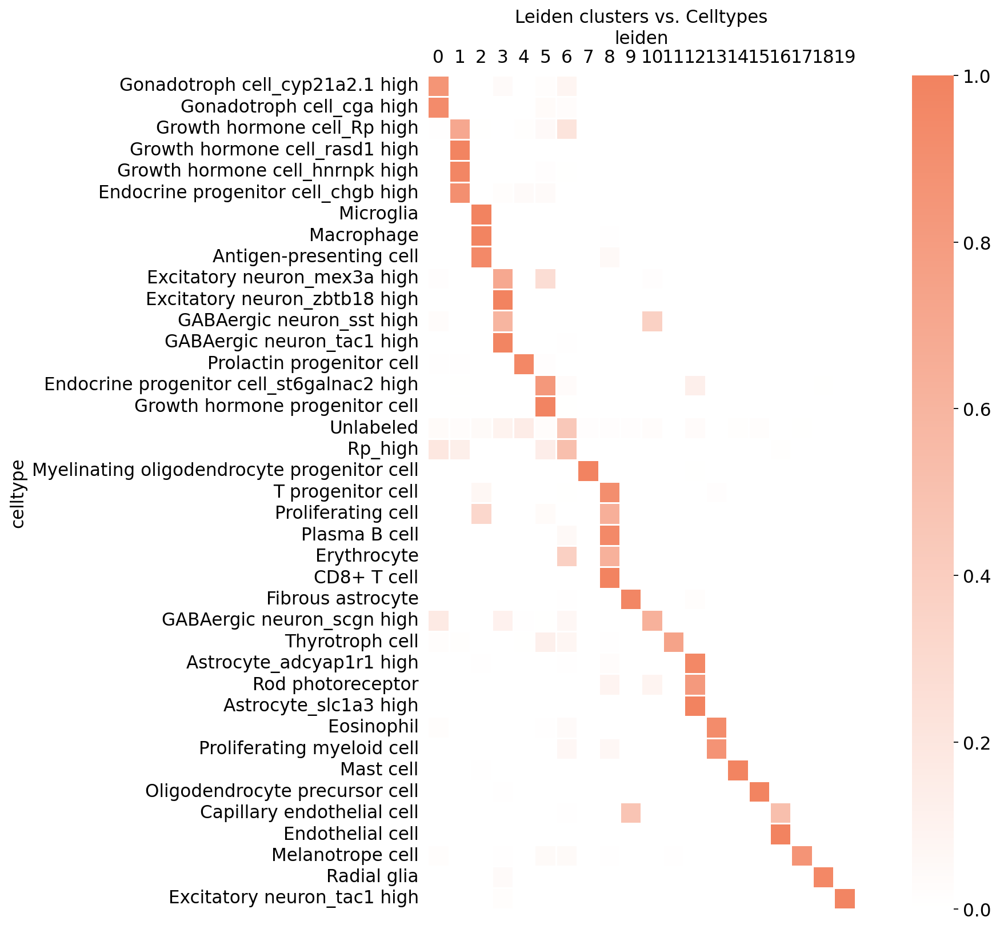

In [18]:
ctmx = sc.metrics.confusion_matrix("celltype", "leiden", orthogroup_data.adata.obs)
ctmx_diag = diagonalize_df(ctmx)

plt.figure(figsize = (16, 12))
sns.heatmap(ctmx_diag, square = True, cmap = 'arcadia:ambers', linewidth = 0.5)
plt.gca().xaxis.tick_top()
plt.gca().xaxis.set_label_position('top')
plt.tick_params(left = False, top = False)
plt.title('Leiden clusters vs. Celltypes')
plt.savefig(sample_BFD.directory + sample_BFD.species_prefix + '_Leiden-vs-Celltypes-confusion-Orthogroups.pdf')

# 7B. Get top marker orthogroups and plot them

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:09)


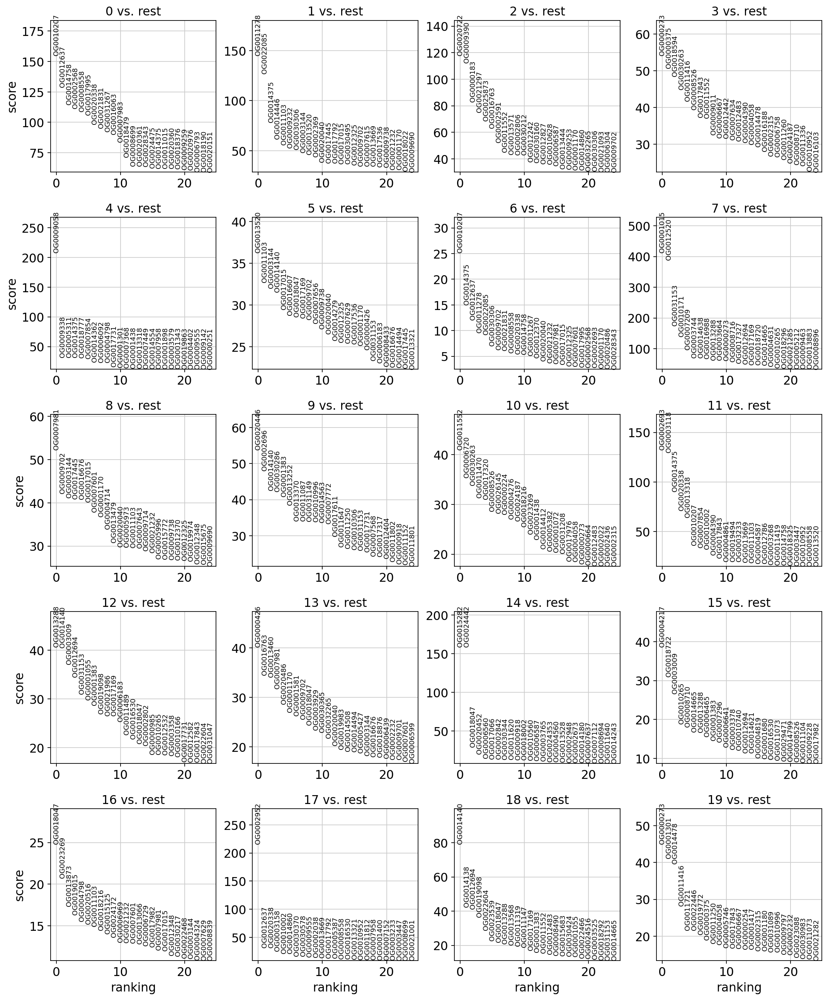

Wrote 1200 gene ids to /home/ec2-user/glial-origins/output/Xlae_adultbrain/Xlae_OrthoFinder_top_100_Orthogroup_ids.txt
Wrote 1753 gene ids to /home/ec2-user/glial-origins/output/Xlae_adultbrain/Xlae_OrthoFinder_top_150_Orthogroup_ids.txt
Wrote 2261 gene ids to /home/ec2-user/glial-origins/output/Xlae_adultbrain/Xlae_OrthoFinder_top_200_Orthogroup_ids.txt
Wrote 2261 gene ids to /home/ec2-user/glial-origins/output/Xlae_adultbrain/Xlae_Exc_top_200DE_Orthogroup_ids.txt
Wrote 2703 gene ids to /home/ec2-user/glial-origins/output/Xlae_adultbrain/Xlae_OrthoFinder_top_250_Orthogroup_ids.txt
Wrote 3174 gene ids to /home/ec2-user/glial-origins/output/Xlae_adultbrain/Xlae_OrthoFinder_top_300_Orthogroup_ids.txt


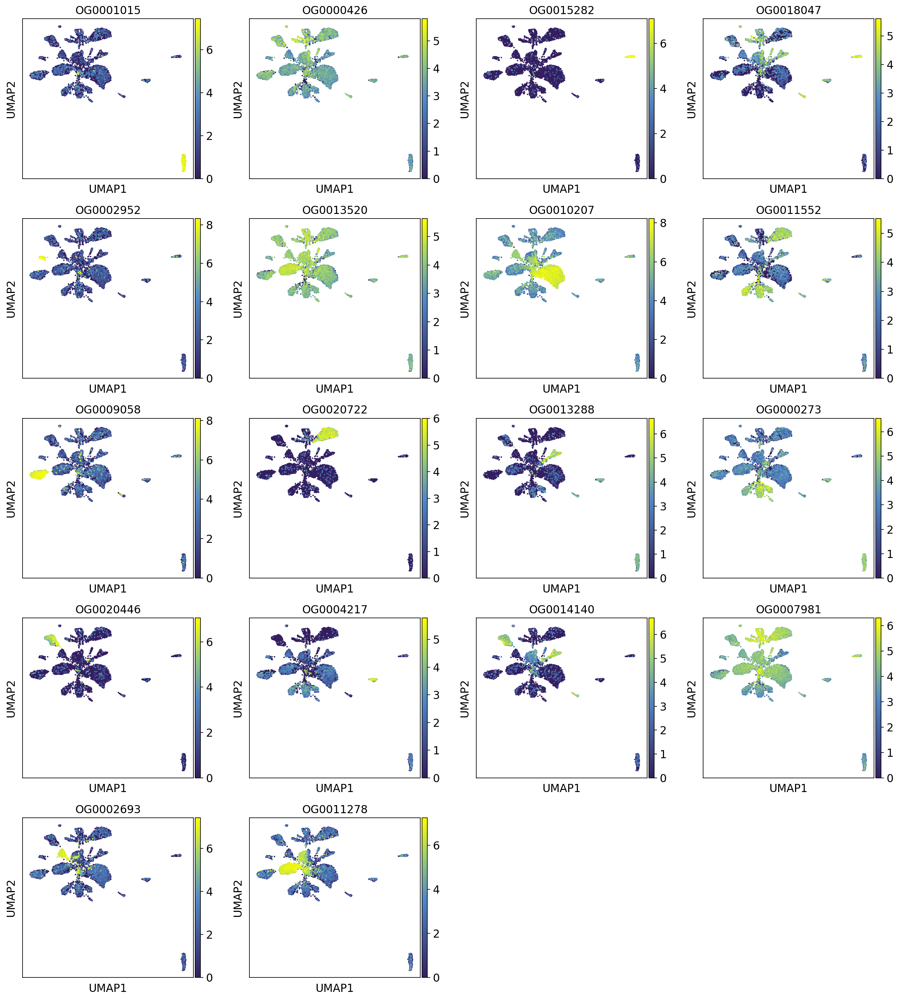

In [19]:
orthogroup_data.rank_genes()

top_number_ranges = [100, 150, 200, 250, 300]

for num in top_number_ranges:
    top_orthogroup_key, marker_orthogroup_key = orthogroup_data.get_top_genes('Orthogroup', top_number = num)
    
    filename_overwrite = '_'.join([scanpy_data.species_prefix, 'OrthoFinder', 'top', str(num), 'Orthogroup', 'ids.txt'])
    orthogroup_data.export_top_genes(top_orthogroup_key, filename_overwrite = filename_overwrite)
    
    if num == 200:
        orthogroup_data.export_top_genes(top_orthogroup_key)

    top_orthogroup_filekey = top_orthogroup_key + '_file'
    sample_BFD.add_keyfile(f'top{num}Orthogroups', getattr(orthogroup_data, top_orthogroup_filekey), overwrite = True)
    
    if num == 200:
        sample_BFD.add_keyfile('topOrthogroups', getattr(orthogroup_data, top_orthogroup_filekey), overwrite = True)

sc.pl.umap(orthogroup_data.adata, color=getattr(orthogroup_data, marker_orthogroup_key), cmap = 'arcadia:viridis')

In [20]:
sample_BFD.local_to_s3()
sample_BFD.pickle()
sample_BFD.push_to_s3(overwrite = True)

XENLA_9.2_Xenbase.gtf already exists in S3 bucket, skipping upload. set overwrite = True to overwrite the existing file.
XENLA_9.2_GCA.gff already exists in S3 bucket, skipping upload. set overwrite = True to overwrite the existing file.
XENLA_9.2_genome.fa already exists in S3 bucket, skipping upload. set overwrite = True to overwrite the existing file.
GSM6214268_Xenopus_brain_COL65_dge.txt already exists in S3 bucket, skipping upload. set overwrite = True to overwrite the existing file.
Xlae_adultbrain_Xenbase_UniProtIDs.txt already exists in S3 bucket, skipping upload. set overwrite = True to overwrite the existing file.
Xlae_adultbrain_uniprot-idmm.tsv already exists in S3 bucket, skipping upload. set overwrite = True to overwrite the existing file.
Xlae_adultbrain_gtf-idmm.tsv already exists in S3 bucket, skipping upload. set overwrite = True to overwrite the existing file.
XENLA_9.2_genome_cDNA.fa already exists in S3 bucket, skipping upload. set overwrite = True to overwrite th

### Extract information about cluster membership

In [21]:
gxc_clusters = scanpy_data.adata.obs.copy(deep = True)
gxc_clusters['leiden'] = 'GeneClust_' + gxc_clusters['leiden'].astype('str')
gxc_clusters.rename(columns = {'leiden': 'leiden_genes'}, inplace = True)
gxc_clusters['cell_barcode'] = gxc_clusters.index
gxc_clusters = gxc_clusters[['cell_barcode', 'leiden_genes']].reset_index(drop = True)
display(gxc_clusters)

exc_clusters = orthogroup_data.adata.obs.copy(deep = True)
exc_clusters['leiden'] = 'OrthogroupClust_' + exc_clusters['leiden'].astype('str')
exc_clusters.rename(columns = {'leiden': 'leiden_orthogroups'}, inplace = True)
exc_clusters['cell_barcode'] = exc_clusters.index
exc_clusters = exc_clusters[['cell_barcode', 'leiden_orthogroups']].reset_index(drop = True)
display(exc_clusters)

merged_table = gxc_clusters.merge(exc_clusters, on = 'cell_barcode')
display(merged_table)

,cell_barcode,leiden_genes
0,AACCTAGCGAATTAGAGA,GeneClust_7
1,CTGTGTGATCTTCCGCTA,GeneClust_12
2,AAGCGGGGTACAATGGCG,GeneClust_5
3,CTCGCACGTATTCTGAAA,GeneClust_8
4,CTGTGTTTGGACTATTGT,GeneClust_8
...,...,...
8987,TATGTATAGTCGGCGTGC,GeneClust_4
8988,AACCTATTCATATAACGG,GeneClust_4
8989,TAGTCGTCTACCTGAAGC,GeneClust_4
8990,CCGCTAATGGCGGCGTGC,GeneClust_8


,cell_barcode,leiden_orthogroups
0,AACCTAGCGAATTAGAGA,OrthogroupClust_5
1,CTGTGTGATCTTCCGCTA,OrthogroupClust_11
2,AAGCGGGGTACAATGGCG,OrthogroupClust_3
3,CTCGCACGTATTCTGAAA,OrthogroupClust_7
4,CTGTGTTTGGACTATTGT,OrthogroupClust_7
...,...,...
8451,ACACCCATGGCGGCGTGC,OrthogroupClust_10
8452,GTTGCCGCGTGCCCAGAC,OrthogroupClust_6
8453,TATGTATAGTCGGCGTGC,OrthogroupClust_6
8454,CCGCTAATGGCGGCGTGC,OrthogroupClust_7


,cell_barcode,leiden_genes,leiden_orthogroups
0,AACCTAGCGAATTAGAGA,GeneClust_7,OrthogroupClust_5
1,CTGTGTGATCTTCCGCTA,GeneClust_12,OrthogroupClust_11
2,AAGCGGGGTACAATGGCG,GeneClust_5,OrthogroupClust_3
3,CTCGCACGTATTCTGAAA,GeneClust_8,OrthogroupClust_7
4,CTGTGTTTGGACTATTGT,GeneClust_8,OrthogroupClust_7
...,...,...,...
8451,ACACCCATGGCGGCGTGC,GeneClust_4,OrthogroupClust_10
8452,GTTGCCGCGTGCCCAGAC,GeneClust_4,OrthogroupClust_6
8453,TATGTATAGTCGGCGTGC,GeneClust_4,OrthogroupClust_6
8454,CCGCTAATGGCGGCGTGC,GeneClust_8,OrthogroupClust_7


### Generate Sankey plots

In [22]:
import plotly.graph_objects as go
import numpy as np

items = sorted(list(merged_table['leiden_genes'].unique())) + sorted(list(merged_table['leiden_orthogroups'].unique()))
items_dict = {items[i]: i for i in np.arange(0, len(items))}

source = []
target = []
value = []
color = []

for i in merged_table['leiden_genes'].unique():
    subtable = merged_table[merged_table['leiden_genes'] == i]
    values = pd.DataFrame(subtable['leiden_orthogroups'].value_counts())
    source = source + [items_dict[i] for j in np.arange(0, len(values))]
    target = target + [items_dict[k] for k in list(values.index.values)]
    value = value + list(values['leiden_orthogroups'].values)
    color = color + [apc.arcadia_Accent_all['arcadia:canary'] if i == max(values['leiden_orthogroups'].values) else apc.arcadia_Accent_all['arcadia:oat'] for i in values['leiden_orthogroups'].values]

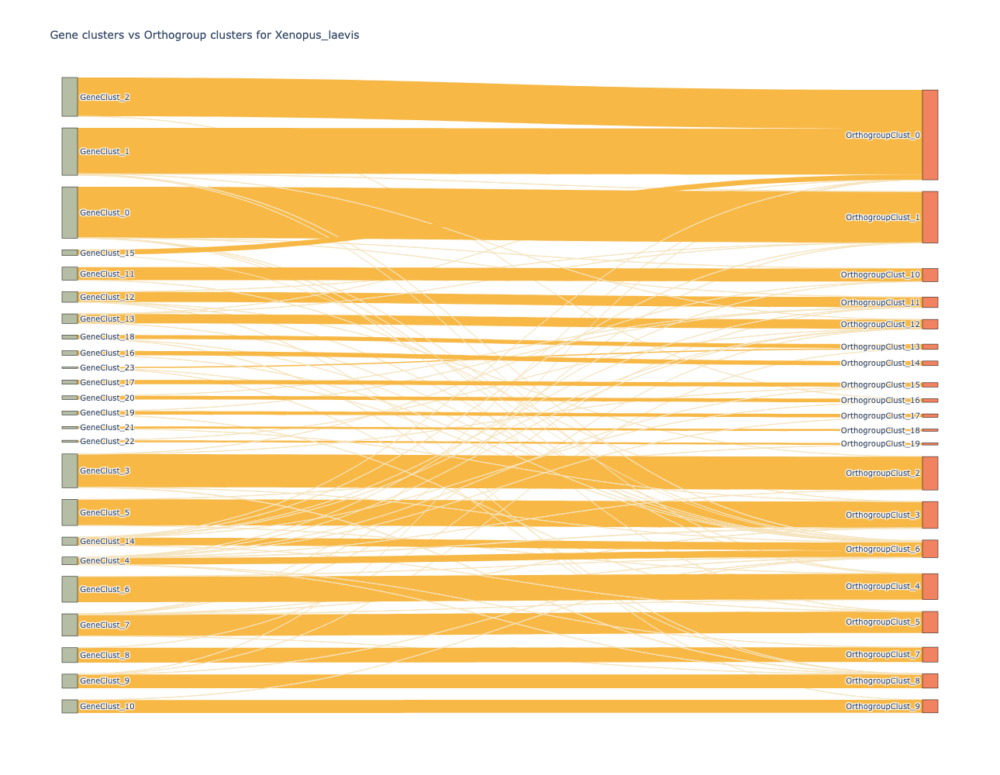

In [23]:
fig = go.Figure(data=[go.Sankey(
    node = dict(
      pad = 15,
      thickness = 20,
      line = dict(color = "black", width = 0.5),
      label = list(items_dict.keys()),
      color = [apc.arcadia_Accent_all['arcadia:amber'] if 'Orthogroup' in i else apc.arcadia_Accent_all['arcadia:sage'] for i in list(items_dict.keys()) ]
    ),
    link = dict(
      source = source,
      target = target,
      value = value,
      color = color
  ))])

config = {
  'toImageButtonOptions': {
    'format': 'svg', # one of png, svg, jpeg, webp
    'filename': '_'.join([sample_BFD.directory, sample_BFD.species_prefix, 'Gene-vs-OG-flow']),
  }
}

fig.update_layout(title_text="Gene clusters vs Orthogroup clusters for " + sample_BFD.species, font_size=10, width=600, height=1000)
fig.write_html('_'.join([sample_BFD.directory, sample_BFD.species_prefix, 'Gene-vs-OG-flow.html']))
fig.show(config = config)

### Display total genes and shared feature groups

In [24]:
total_genes = len([i for i in scanpy_data.adata.var.highly_variable if i == True])
total_ogs = len([i for i in orthogroup_data.adata.var.highly_variable if i == True])

display(total_genes, total_ogs)

12574

7073